In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter, MinuteLocator, SecondLocator
import numpy as np
import datetime as dt

import geopandas as gpd
from shapely.geometry import Point

In [ ]:
interests = pd.read_csv("H:\\jupyter\\CityTraffic\data\\stupino_interests.csv")

In [ ]:
from hydra import initialize, compose
from omegaconf import OmegaConf

with initialize(version_base=None, config_path="..\\scripts\\config\\"):
    cfg = compose(config_name='config.yaml')

In [ ]:
# old all
# launch_time = "2023-05-02_16-11-15" 

#60m all
launch_time = "2023-05-05_10-08-16"

#cur
# launch_time = "2023-05-04_20-54-38"
cluster_data = pd.read_csv(f"H:\\jupyter\\CityTraffic\data\\{launch_time}\\clusters_{launch_time}.csv")
df = pd.read_csv(f"H:\\jupyter\\CityTraffic\data\\{launch_time}\\data_with_clusters_{launch_time}.csv", index_col=0)
pd.reset_option('display.max_rows')

In [159]:
df.head()

,lat,lon,is_weekday,hour,cnt,first_ts,last_ts,log_date,source,dt,id,cluster
0,54.8436,38.0920,True,19,1,1675787814,1675787814,2023-02-07,1,2023-02-09,0,0
1,54.8849,38.0801,True,10,5,1677136364,1677138975,2023-02-23,2,2023-02-23,0,1
2,54.8811,38.0674,True,16,1,1675948094,1675948094,2023-02-09,1,2023-02-09,0,2
3,54.8814,38.0664,True,13,1,1675421380,1675421380,2023-02-03,1,2023-02-09,0,2
4,54.8797,38.0690,True,14,145,1677239575,1677239993,2023-02-24,2,2023-02-24,0,-1


In [160]:
df.shape

(8510085, 12)

In [161]:
cluster_data.sort_values(['id', 'cluster_size'])

,id,lat,lon,cluster,cluster_size,geohash,time_ratio_weekday_True,time_ratio_weekday_False
1,0,54.8849,38.0801,1,164,202320012230133313,0.200323,0.207787
0,0,54.8436,38.0918,0,314,202320021103223322,0.340531,0.446350
2,0,54.8812,38.0673,2,359,202320012230012300,0.434683,0.268216
3,1,54.8889,38.0915,0,701,202320012230210010,0.959063,0.927411
6,2,54.8539,38.1836,2,20,202320012300333111,0.000065,0.006894
...,...,...,...,...,...,...,...,...
43928,21831,54.8468,38.0536,1,38,202320012223333201,0.016670,0.071187
43927,21831,54.8446,38.0468,0,198,202320012223330001,0.966992,0.885926
43931,21832,54.9384,38.0178,2,31,202320012220222033,0.011383,0.000000
43929,21832,54.9397,38.0183,0,33,202320012220221301,0.017334,0.000000


In [162]:
def timelines(ax, wd, xstart, xstop, color='b'):
    """Plot timelines at y from xstart to xstop with given color."""   
    ax.hlines(wd, xstart, xstop, color, lw=20)

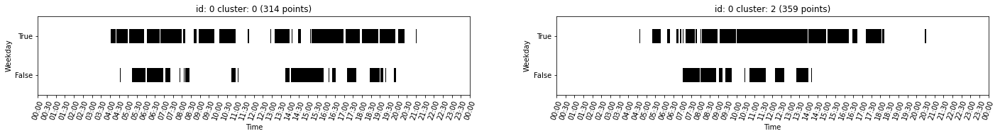

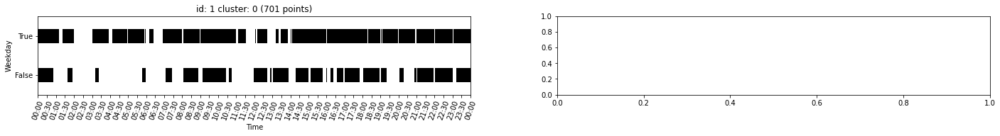

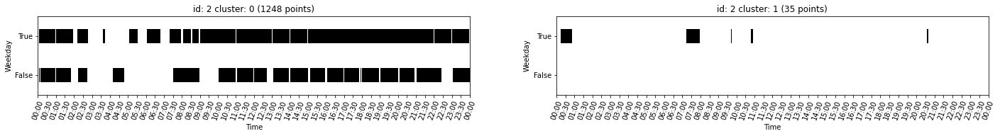

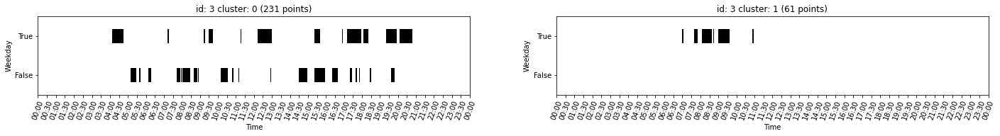

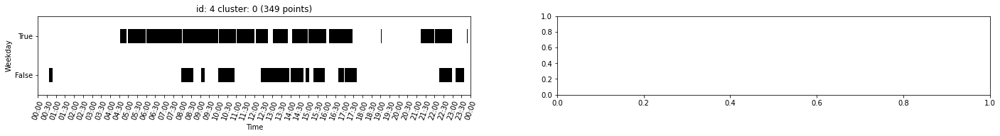

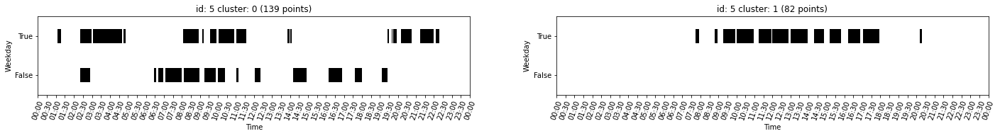

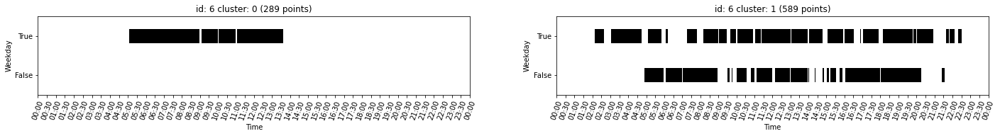

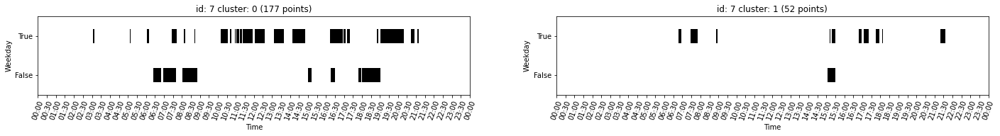

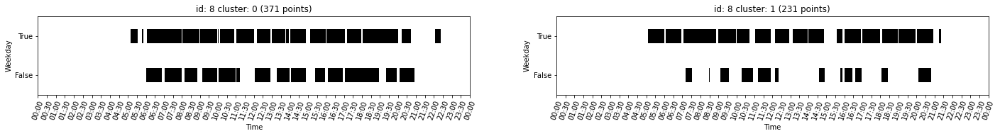

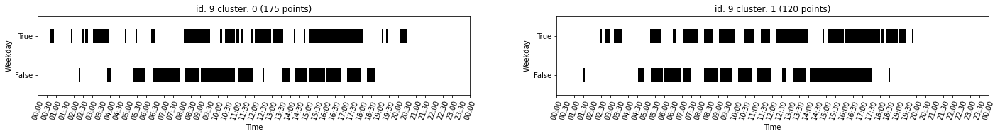

In [163]:
max_clusters = 2

id_list = pd.unique(df['id'])[:10]

for i_id in range(len(id_list)):
    plt.figure(figsize=(24,24));
    id_test = id_list[i_id]
    id_cluster = cluster_data[(cluster_data['id'] == id_test)].sort_values(['cluster_size'])[-max_clusters:]
    id_cluster = id_cluster.sort_values(['cluster'])
    cluster_number = id_cluster.shape[0]
    pos = 0
    for cluster_test in id_cluster['cluster']:
        ax = plt.subplot(len(id_list), max_clusters, pos + max_clusters * i_id + 1)
        pos += 1

        id_df = df[(df['id'] == id_test) & ((df['cluster'] == cluster_test))]
        # y = pd.to_datetime(id_df['log_date']).apply(lambda x: x.weekday())
        y = id_df['is_weekday']
        first = id_df['first_ts'] % (3600 * 24)
        last = id_df['last_ts'] % (3600 * 24)
            
        # timelines(ax, y[y], first[y], last[y], color='black')
        # timelines(ax, y[~y], first[~y], last[~y], color='black')
        ax.hlines(y[y], first[y], last[y], color='black', lw=20)
        ax.hlines(y[~y], first[~y], last[~y], color='black', lw=20)

        xticks = [1800 * i for i in range(49)]
        xlabels = [pd.to_datetime(tick, unit='s').strftime('%H:%M') for tick in xticks]

        ax.set_yticks(range(2))
        ax.set_xticks(xticks)
        ax.set_xlim(0, 86400)
        ax.set_ylim(-0.5, 1.5)
        ax.set_xticklabels(xlabels, rotation=70)
        ax.set_yticklabels(['False', 'True'])
        ax.set_xlabel('Time')
        ax.set_ylabel('Weekday')
        points_in_cluster = id_cluster['cluster_size'][id_cluster['cluster'] == cluster_test].iloc[0]
        ax.set_title(f"id: {id_test} cluster: {cluster_test} ({points_in_cluster} points)")
    

    if cluster_number != max_clusters:
        for add_empty in range(max_clusters - cluster_number):
            ax = plt.subplot(len(id_list), max_clusters, pos +  max_clusters * i_id + 1)
            pos += 1


In [108]:
pd.set_option('display.max_rows', None)
inter = interests[interests['id'].isin(id_list)].T
cur_inter = inter[np.logical_not(inter.index.str.contains('interest'))].copy()
rename_dict = {cur_inter.columns[i] : cur_inter.loc['id'].values[i] for i in range(cur_inter.shape[1])}
cur_inter.drop(['id'], axis=0, inplace=True)
cur_inter.rename(columns=rename_dict, inplace=True)
print(cur_inter)
pd.reset_option('display.max_rows')

                                                    3  0  2  7  4  1  8  6  9
marital_status_married                              0  1  0  0  0  1  0  0  0
marital_status_not_married                          1  0  0  1  1  0  0  1  0
employment_working                                  0  0  1  1  0  1  1  1  0
employment_not_working                              1  1  0  0  0  0  0  0  0
availability_of_education_has_a_higher_education    0  1  1  0  1  1  1  1  1
availability_of_education_no_higher_education       1  1  0  1  1  0  1  1  0
children_under_16_there_are_children_in_the_family  1  1  1  0  1  1  1  1  1
children_under_16_no_children_in_the_family         0  1  1  1  1  0  1  1  0
age_18_24                                           0  0  1  0  1  0  0  1  0
age_25_34                                           0  1  0  1  0  0  0  1  0
age_35_44                                           0  0  0  0  0  1  1  0  0
age_45_54                                           0  0  1  0  

In [109]:
two_best = pd.DataFrame(columns=cluster_data.columns)
for cur_id in pd.unique(cluster_data['id']):
    cur_id_cluster = cluster_data.query('id == @cur_id')
    add_to = cur_id_cluster.sort_values('cluster_size')[-max_clusters:]
    two_best = pd.concat([two_best, add_to])

KeyboardInterrupt: 

In [11]:
two_best.head()

,id,lat,lon,cluster,cluster_size,geohash,time_ratio_weekday_True,time_ratio_weekday_False
0,0,54.8436,38.0918,0,314,202320021103223322,0.340531,0.446350
2,0,54.8812,38.0673,2,359,202320012230012300,0.434683,0.268216
3,1,54.8889,38.0915,0,701,202320012230210010,0.959063,0.927411
5,2,54.8509,38.1872,1,35,202320012300333013,0.020615,0.000005
4,2,54.8436,38.1929,0,1248,202320021032333003,0.970371,0.990534


In [12]:
sparse_clusters = two_best.query("0.5 < time_ratio_weekday_True < 0.6 and 0.6 > time_ratio_weekday_False > 0.5")
sparse_clusters

,id,lat,lon,cluster,cluster_size,geohash,time_ratio_weekday_True,time_ratio_weekday_False


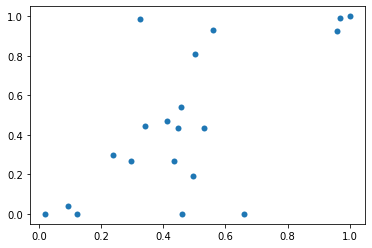

In [13]:
plt.scatter(two_best["time_ratio_weekday_True"], two_best["time_ratio_weekday_False"], lw=0.0000001);
plt.show()

### Cleaning data

In [9]:
clean_df = df.copy()

In [10]:
clean_df.head()

,lat,lon,is_weekday,hour,cnt,first_ts,last_ts,log_date,source,dt,id,cluster
0,54.8436,38.0920,True,19,1,1675787814,1675787814,2023-02-07,1,2023-02-09,0,0
1,54.8849,38.0801,True,10,5,1677136364,1677138975,2023-02-23,2,2023-02-23,0,1
2,54.8811,38.0674,True,16,1,1675948094,1675948094,2023-02-09,1,2023-02-09,0,2
3,54.8814,38.0664,True,13,1,1675421380,1675421380,2023-02-03,1,2023-02-09,0,2
4,54.8797,38.0690,True,14,145,1677239575,1677239993,2023-02-24,2,2023-02-24,0,-1


In [11]:
clean_df.shape

(7271, 12)

In [12]:
drop_not_weekday = True
min_slots = 16
number_of_slots = 48
slot_len = 30 #30 minutes
min_days = 5

In [13]:
if drop_not_weekday:
    clean_df = clean_df.query('is_weekday == True')


In [14]:
clean_df.shape

(5270, 12)

In [15]:
new_df = pd.DataFrame(columns=clean_df.columns)

In [74]:
cleaned_id

{0: Index(['2023-01-31', '2023-02-01', '2023-02-03', '2023-02-08', '2023-02-09',
        '2023-02-24'],
       dtype='object'),
 1: Index(['2023-02-01', '2023-02-06', '2023-02-07', '2023-02-09', '2023-02-13',
        '2023-02-15', '2023-02-22', '2023-02-24', '2023-02-27'],
       dtype='object'),
 2: Index(['2023-02-01', '2023-02-03', '2023-02-06', '2023-02-07', '2023-02-08',
        '2023-02-10', '2023-02-13', '2023-02-14', '2023-02-15', '2023-02-16',
        '2023-02-17', '2023-02-20', '2023-02-21', '2023-02-22', '2023-02-23',
        '2023-02-24', '2023-02-27', '2023-02-28'],
       dtype='object'),
 6: Index(['2023-01-27', '2023-01-31', '2023-02-01', '2023-02-02', '2023-02-03',
        '2023-02-06', '2023-02-07', '2023-02-13', '2023-02-17', '2023-02-20',
        '2023-02-21', '2023-02-22', '2023-02-27'],
       dtype='object'),
 8: Index(['2023-02-01', '2023-02-02', '2023-02-03', '2023-02-06', '2023-02-07',
        '2023-02-08', '2023-02-09', '2023-02-10', '2023-02-13', '2023-02-14

In [16]:
def get_slot(x):
    hh, mm = pd.to_datetime(x, unit='s').strftime('%H:%M').split(':')
    return (int(hh) * 60 + int(mm)) // slot_len

columns_for_slots = list(map(str, range(number_of_slots + 1)))
cleaned_id = dict()
id_list = pd.unique(df['id'])

for cur_id in id_list:
    cur_id_df = clean_df.query("id == @cur_id")
    days = pd.unique(cur_id_df['log_date'])
    days.sort()
    cur_id_slots = pd.DataFrame(columns=columns_for_slots, index=days).fillna(0)

    for date, row in cur_id_slots.iterrows():
        day_info = cur_id_df.query('log_date == @date')
        for i, row in day_info.iterrows():
            first = pd.to_datetime(row['first_ts'], unit='s').strftime('%H:%M')
            last = pd.to_datetime(row['last_ts'], unit='s').strftime('%H:%M')
            slots = row[['first_ts', 'last_ts']].apply(get_slot).values
            for slot in slots:
                cur_id_slots.loc[date, str(slot)] = 1        
                # print(date, first, last, row[['first_ts', 'last_ts']].apply(get_slot))
    good_days = cur_id_slots[cur_id_slots.sum(axis=1) > min_slots].index
    new_df = pd.concat([new_df, cur_id_df[cur_id_df['log_date'].isin(good_days)]], ignore_index=True)
    if cur_id_slots[cur_id_slots.sum(axis=1) > min_slots].shape[0] > min_days:
        cleaned_id[cur_id] = good_days
new_df = new_df[new_df['id'].isin(cleaned_id.keys())]


BROKEN

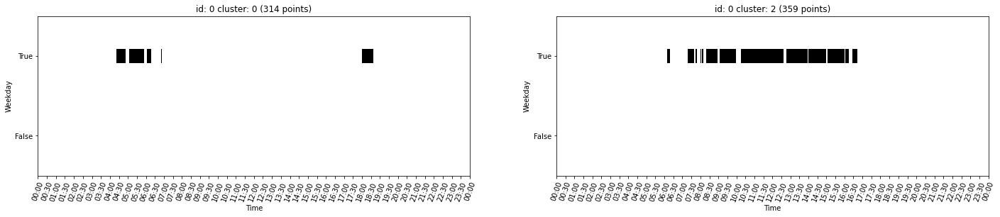

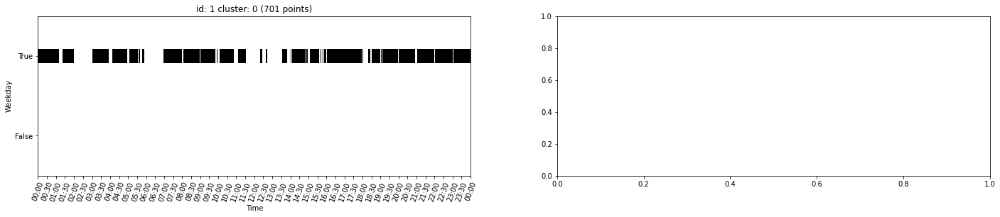

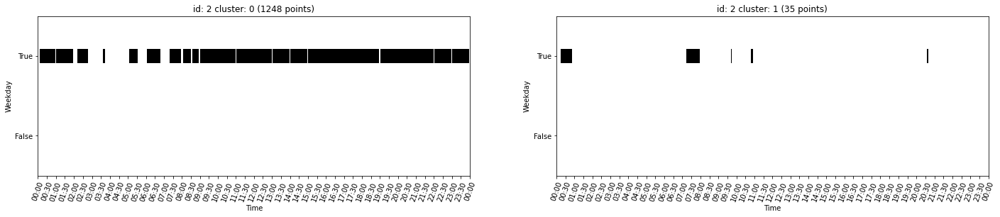

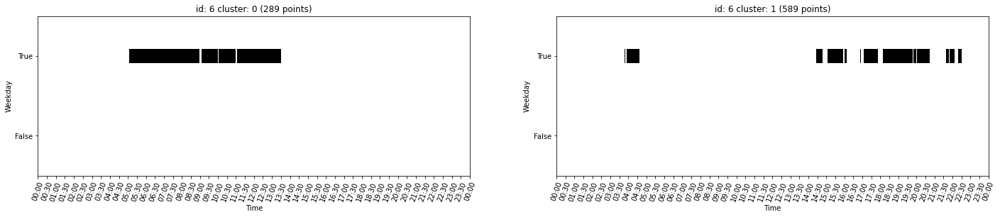

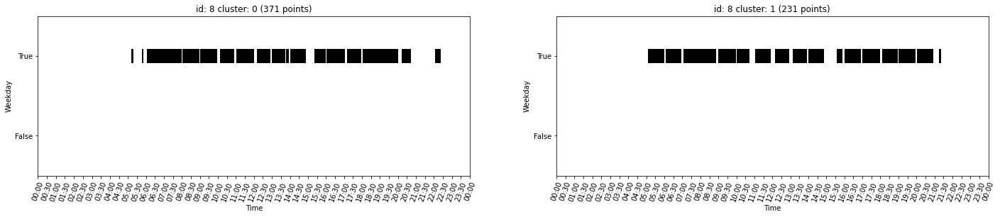

In [101]:
max_clusters = 2

id_list = pd.unique(new_df['id'])


for i_id in range(len(id_list)):
    plt.figure(figsize=(24,24));
    id_test = id_list[i_id]
    id_cluster = cluster_data[(cluster_data['id'] == id_test)].sort_values(['cluster_size'])[-max_clusters:]
    id_cluster = id_cluster.sort_values(['cluster'])
    cluster_number = id_cluster.shape[0]
    pos = 0
    for cluster_test in id_cluster['cluster']:
        ax = plt.subplot(len(id_list), max_clusters, pos + max_clusters * i_id + 1)
        pos += 1

        id_df = new_df[(new_df['id'] == id_test) & ((new_df['cluster'] == cluster_test))]
        # y = pd.to_datetime(id_df['log_date']).apply(lambda x: x.weekday())
        y = np.ones_like(id_df['is_weekday'])
        hms = pd.to_datetime(id_df['first_ts'], unit='s').apply(lambda x: list(map(int, x.strftime('%H:%M:%S').split(':'))))
        first = hms.apply(lambda x: 3600 * x[0] + 60 * x[1] + x[2])
        print()
        
        hms = pd.to_datetime(id_df['last_ts'], unit='s').apply(lambda x: list(map(int,x.strftime('%H:%M:%S').split(':'))))
        last = hms.apply(lambda x: 3600 * x[0] + 60 * x[1] + x[2])
            
        # timelines(ax, y[y], first[y], last[y], color='black')
        # timelines(ax, y[~y], first[~y], last[~y], color='black')

        # ax.hlines(y[~y], first[~y], last[~y], color='black', lw=20)

        ax.hlines(y, first, last, color='black', lw=20)
        xticks = [1800 * i for i in range(49)]
        xlabels = [pd.to_datetime(tick, unit='s').strftime('%H:%M') for tick in xticks]
        ax.set_yticks(range(2))
        ax.set_xticks(xticks)
        ax.set_xlim(0, 86400)
        ax.set_ylim(-0.5, 1.5)
        ax.set_xticklabels(xlabels, rotation=70)
        ax.set_yticklabels(['False', 'True'])
        ax.set_xlabel('Time')
        ax.set_ylabel('Weekday')
        points_in_cluster = id_cluster['cluster_size'][id_cluster['cluster'] == cluster_test].iloc[0]
        ax.set_title(f"id: {id_test} cluster: {cluster_test} ({points_in_cluster} points)")
    

    if cluster_number != max_clusters:
        for add_empty in range(max_clusters - cluster_number):
            ax = plt.subplot(len(id_list), max_clusters, pos +  max_clusters * i_id + 1)
            pos += 1

In [30]:
pd.set_option('display.max_rows', None)
inter = interests[interests['id'].isin(id_list)].T
cur_inter = inter[np.logical_not(inter.index.str.contains('interest'))].copy()
rename_dict = {cur_inter.columns[i] : cur_inter.loc['id'].values[i] for i in range(cur_inter.shape[1])}
cur_inter.drop(['id'], axis=0, inplace=True)
cur_inter.rename(columns=rename_dict, inplace=True)
print(cur_inter)
pd.reset_option('display.max_rows')

                                                    0  2  1  8  6
marital_status_married                              1  0  1  0  0
marital_status_not_married                          0  0  0  0  1
employment_working                                  0  1  1  1  1
employment_not_working                              1  0  0  0  0
availability_of_education_has_a_higher_education    1  1  1  1  1
availability_of_education_no_higher_education       1  0  0  1  1
children_under_16_there_are_children_in_the_family  1  1  1  1  1
children_under_16_no_children_in_the_family         1  1  0  1  1
age_18_24                                           0  1  0  0  1
age_25_34                                           1  0  0  0  1
age_35_44                                           0  0  1  1  0
age_45_54                                           0  1  0  0  0
individual_income_a_below_average_income            0  1  0  0  0
individual_income_b_average_income                  0  0  0  0  0
individual

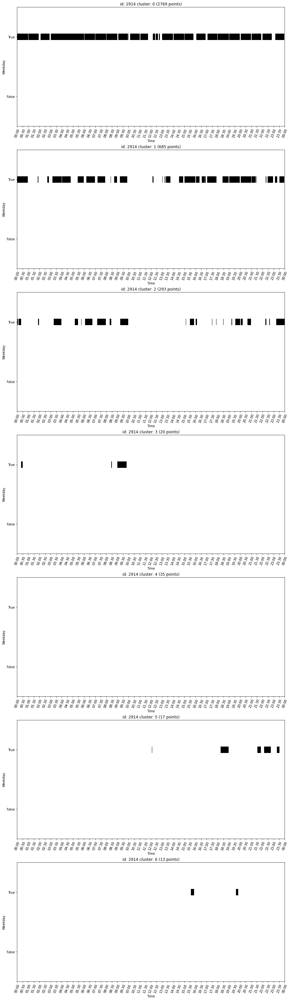

In [398]:
# id_test = pd.unique(new_df['id'])[4]
id_test = 2914
max_clusters = cluster_data.groupby('id')['cluster'].count().loc[id_test]

plt.figure(figsize=(15,max_clusters*8));

id_cluster = cluster_data[(cluster_data['id'] == id_test)].sort_values(['cluster_size'])[-max_clusters:]
id_cluster = id_cluster.sort_values(['cluster'])
cluster_number = id_cluster.shape[0]
pos = 0
for cluster_test in id_cluster['cluster']:
    ax = plt.subplot(max_clusters, 1, pos + 1)
    pos += 1

    id_df = new_df[(new_df['id'] == id_test) & ((new_df['cluster'] == cluster_test))]
    # y = pd.to_datetime(id_df['log_date']).apply(lambda x: x.weekday())
    y = np.ones_like(id_df['is_weekday'])
    hms = pd.to_datetime(id_df['first_ts'], unit='s').apply(lambda x: list(map(int, x.strftime('%H:%M:%S').split(':'))))
    first = hms.apply(lambda x: 3600 * x[0] + 60 * x[1] + x[2])
    print()
    
    hms = pd.to_datetime(id_df['last_ts'], unit='s').apply(lambda x: list(map(int,x.strftime('%H:%M:%S').split(':'))))
    last = hms.apply(lambda x: 3600 * x[0] + 60 * x[1] + x[2])
        
    # timelines(ax, y[y], first[y], last[y], color='black')
    # timelines(ax, y[~y], first[~y], last[~y], color='black')

    # ax.hlines(y[~y], first[~y], last[~y], color='black', lw=20)

    ax.hlines(y, first, last, color='black', lw=20)
    xticks = [1800 * i for i in range(49)]
    xlabels = [pd.to_datetime(tick, unit='s').strftime('%H:%M') for tick in xticks]
    ax.set_yticks(range(2))
    ax.set_xticks(xticks)
    ax.set_xlim(0, 86400)
    ax.set_ylim(-0.5, 1.5)
    ax.set_xticklabels(xlabels, rotation=70)
    ax.set_yticklabels(['False', 'True'])
    ax.set_xlabel('Time')
    ax.set_ylabel('Weekday')
    points_in_cluster = id_cluster['cluster_size'][id_cluster['cluster'] == cluster_test].iloc[0]
    ax.set_title(f"id: {id_test} cluster: {cluster_test} ({points_in_cluster} points)")


# if cluster_number != max_clusters:
#     for add_empty in range(max_clusters - cluster_number):
#         ax = plt.subplot(len(id_list), max_clusters, pos +  max_clusters * i_id + 1)
#         pos += 1

### Group-by way

In [31]:
clean_df = df.copy()

In [32]:
clean_df.shape

(8510085, 12)

In [34]:
only_weekday = False
min_slots = 16
number_of_slots = 48
slot_len = 30 #30 minutes
min_days = 5
drop_noise = True

In [35]:
if only_weekday:
    clean_df = clean_df.query('is_weekday == True')
    
if drop_noise:
    clean_df = clean_df.query('cluster != -1')

In [36]:
clean_df.shape

(7490815, 12)

In [37]:
new_df = pd.DataFrame(columns=clean_df.columns)

In [38]:
def get_slot(x):
    hm = pd.to_datetime(x, unit='s').dt.strftime('%H:%M').str.split(':')
    return hm.apply(lambda x: (60 * int(x[0]) + int(x[1])) // slot_len)

In [39]:
id_list = pd.unique(clean_df['id'])
for cur_id in id_list:
    cur_id_df = clean_df.query("id == @cur_id")
    cur_id_df.loc[:, ['first_slot', 'last_slot']] = cur_id_df[['first_ts', 'last_ts']].apply(get_slot).values

    days_info = cur_id_df[['log_date', 'first_slot', 'last_slot']].set_index('log_date').stack().groupby('log_date')\
        .agg(first_slot='unique', last_slot='unique')

    mapped = days_info['first_slot'].map(len)
    good_days = mapped[mapped >= min_slots].index
    
    if len(good_days) >= min_days:
        new_df = pd.concat([new_df, cur_id_df[cur_id_df['log_date'].isin(good_days)]], ignore_index=True)

In [40]:
cleaned_cluster_data = cluster_data[cluster_data['id'].isin(pd.unique(new_df['id']))]

In [47]:
cleaned_cluster_data.to_csv(r"H:\jupyter\CityTraffic\data\cleaned_cluster_data_wk.csv")

In [50]:
new_df.to_csv(r"H:\jupyter\CityTraffic\data\cleaned_locs_data_wk.csv")

In [41]:
geometry = [Point(xy) for xy in zip(cleaned_cluster_data['lon'], cleaned_cluster_data['lat'])]
gdf = gpd.GeoDataFrame(cleaned_cluster_data, geometry=geometry, crs=4326)
gdf.explore()

In [42]:
new_df

,lat,lon,is_weekday,hour,cnt,first_ts,last_ts,log_date,source,dt,id,cluster,first_slot,last_slot
0,54.8849,38.0801,True,10,5,1677136364,1677138975,2023-02-23,2,2023-02-23,0,1,14.0,15.0
1,54.8811,38.0674,True,16,1,1675948094,1675948094,2023-02-09,1,2023-02-09,0,2,26.0,26.0
2,54.8814,38.0664,True,13,1,1675421380,1675421380,2023-02-03,1,2023-02-09,0,2,21.0,21.0
3,54.8849,38.0800,True,22,2,1675278176,1675280453,2023-02-01,1,2023-02-02,0,1,38.0,39.0
4,54.8849,38.0801,True,12,1,1677229673,1677229673,2023-02-24,2,2023-02-24,0,1,18.0,18.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3298186,54.8849,38.0677,True,12,20,1675415671,1675415883,2023-02-03,2,2023-02-03,21830,1,18.0,18.0
3298187,54.8846,38.0679,False,12,2,1676193822,1676193824,2023-02-12,2,2023-02-12,21830,1,18.0,18.0
3298188,54.8848,38.0677,True,19,13,1676650015,1676653010,2023-02-17,2,2023-02-17,21830,1,32.0,33.0
3298189,54.8846,38.0679,True,21,5,1676312370,1676314477,2023-02-13,2,2023-02-13,21830,1,36.0,37.0


### Labeling

In [457]:
ts = pd.read_csv(r"H:\jupyter\CityTraffic\data\cleaned_locs_data_wk.csv", index_col=0)

In [564]:
ts.head()

,lat,lon,is_weekday,hour,cnt,first_ts,last_ts,log_date,source,dt,id,cluster,first_slot,last_slot
0,54.8849,38.0801,True,10,5,1677136364,1677138975,2023-02-23,2,2023-02-23,0,1,14,15
1,54.8811,38.0674,True,16,1,1675948094,1675948094,2023-02-09,1,2023-02-09,0,2,22,22
2,54.8814,38.0664,True,13,1,1675421380,1675421380,2023-02-03,1,2023-02-09,0,2,21,21
3,54.8849,38.0800,True,22,2,1675278176,1675280453,2023-02-01,1,2023-02-02,0,1,10,9
4,54.8849,38.0801,True,12,1,1677229673,1677229673,2023-02-24,2,2023-02-24,0,1,18,18


In [459]:
def get_slots(x, slot_len):
    hm = pd.to_datetime(x, unit='s').dt.strftime('%H:%M').str.split(':')
    return hm.apply(lambda x: (60 * int(x[0]) + int(x[1])) // slot_len)

In [466]:
def map_slot(x, number_of_slots):
    if x >= number_of_slots // 2:
        return number_of_slots - x
    return x

In [462]:
func = lambda x: get_slots(x, slot_len)
ts['first_slot'] = ts[['first_ts']].apply(func).values
ts['last_slot'] = ts[['last_ts']].apply(func).values

In [467]:
func = lambda x: map_slot(x, number_of_slots)
ts['first_slot'] = ts['first_slot'].apply(func)
ts['last_slot'] = ts['last_slot'].apply(func)

In [450]:
ts.head()

,lat,lon,is_weekday,hour,cnt,first_ts,last_ts,log_date,source,dt,id,cluster,first_slot,last_slot
0,54.8849,38.0801,True,10,5,1677136364,1677138975,2023-02-23,2,2023-02-23,0,1,14,15
1,54.8811,38.0674,True,16,1,1675948094,1675948094,2023-02-09,1,2023-02-09,0,2,22,22
2,54.8814,38.0664,True,13,1,1675421380,1675421380,2023-02-03,1,2023-02-09,0,2,21,21
3,54.8849,38.0800,True,22,2,1675278176,1675280453,2023-02-01,1,2023-02-02,0,1,10,9
4,54.8849,38.0801,True,12,1,1677229673,1677229673,2023-02-24,2,2023-02-24,0,1,18,18


In [536]:
weekday = True
plot_flag = False
cluster_data['mean_days'] = None
cluster_data['activity'] = None
cluster_data['mean_time'] = None

In [537]:
if plot_flag:
    plt.figure(figsize=(15, 10))
    plt.ylim(0, 1)

id_test = pd.unique(ts['id'])
# id_test = [4835]

for ts_id in id_test:
    id_ts = ts.query('id == @ts_id and is_weekday == @weekday')
    total_slots = len(np.unique(id_ts[['first_slot', 'last_slot']].values.flatten()))
    total_days = len(pd.unique(id_ts['log_date']))
    for cur_cluster in pd.unique(id_ts['cluster']):
        cur_cluster_ts = id_ts.query('cluster == @cur_cluster')

        fs_data = cur_cluster_ts['first_slot'].value_counts().reindex(range(number_of_slots + 1)).fillna(0)
        ls_data = cur_cluster_ts['last_slot'].value_counts().reindex(range(number_of_slots + 1)).fillna(0)
        profile = (fs_data + ls_data) / len(fs_data)

        slots = cur_cluster_ts[['first_slot', 'last_slot']].values.flatten()
        number_of_days = len(pd.unique(cur_cluster_ts['log_date']))
        activity = len(slots) / number_of_days
        mean_days = number_of_days / total_days
        mean_time = slots.mean()

        #predicting
        
        cluster_data.loc[(cluster_data['id'] == ts_id) & (cluster_data['cluster'] == cur_cluster), ['mean_days', 'activity', 'mean_time']] = mean_days, activity, mean_time

        if plot_flag:
            plot_label = f"c:{cur_cluster}; days:{number_of_days} active: {round(activity, 3)} mean:{round(slots.mean(), 3)} std:{round(slots.std(), 3)} label: {label}"
            profile.plot(label=plot_label)
if plot_flag:
    plt.legend();
    plt.title(f"weekday: {weekday} total days: {total_days}");

In [538]:
weekday = False
cluster_data['mean_days_we'] = None
cluster_data['activity_we'] = None
cluster_data['mean_time_we'] = None

id_test = pd.unique(ts['id'])

for ts_id in id_test:
    id_ts = ts.query('id == @ts_id and is_weekday == @weekday')
    total_slots = len(np.unique(id_ts[['first_slot', 'last_slot']].values.flatten()))
    total_days = len(pd.unique(id_ts['log_date']))
    for cur_cluster in pd.unique(id_ts['cluster']):
        cur_cluster_ts = id_ts.query('cluster == @cur_cluster')

        fs_data = cur_cluster_ts['first_slot'].value_counts().reindex(range(number_of_slots + 1)).fillna(0)
        ls_data = cur_cluster_ts['last_slot'].value_counts().reindex(range(number_of_slots + 1)).fillna(0)
        profile = (fs_data + ls_data) / len(fs_data)

        slots = cur_cluster_ts[['first_slot', 'last_slot']].values.flatten()
        number_of_days = len(pd.unique(cur_cluster_ts['log_date']))
        activity = len(slots) / number_of_days
        mean_days = number_of_days / total_days
        mean_time = slots.mean()

        #predicting
        
        cluster_data.loc[(cluster_data['id'] == ts_id) & (cluster_data['cluster'] == cur_cluster), ['mean_days_we', 'activity_we', 'mean_time_we']] = mean_days, activity, mean_time

        if plot_flag:
            plot_label = f"c:{cur_cluster}; days:{number_of_days} active: {round(activity, 3)} mean:{round(slots.mean(), 3)} std:{round(slots.std(), 3)} label: {label}"
            profile.plot(label=plot_label)

In [798]:
cluster_data[cluster_data['id'].isin(id_test)]

,id,lat,lon,cluster,cluster_size,geohash,time_ratio_weekday_True,time_ratio_weekday_False,mean_days,activity,mean_time,label,mean_days_we,activity_we,mean_time_we,daily_shift,mean_id_time
0,0,54.8436,38.0918,0,314,202320021103223322,0.340531,0.446350,0.625,23.6,12.059322,no,1.0,32.0,12.5625,0.000000,16.548469
1,0,54.8849,38.0801,1,164,202320012230133313,0.200323,0.207787,1.0,15.5,14.258065,no,1.0,17.0,13.735294,0.000000,16.548469
2,0,54.8812,38.0673,2,359,202320012230012300,0.434683,0.268216,1.0,47.0,19.050532,no,1.0,34.0,20.073529,0.000000,16.548469
3,1,54.8889,38.0915,0,701,202320012230210010,0.959063,0.927411,1.0,57.111111,11.640078,no,1.0,67.0,11.097015,1.859922,11.552469
4,2,54.8436,38.1929,0,1248,202320021032333003,0.970371,0.990534,1.0,86.0,13.192202,no,1.0,88.333333,14.715094,0.000000,13.610516
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43860,21775,54.8939,38.0688,3,21,202320012230312303,0.023037,0.040417,0.166667,14.0,21.285714,no,0.25,14.0,19.607143,0.000000,NaN
43905,21810,54.9410,38.1372,0,321,202320012232330231,1.000000,1.000000,1.0,28.666667,14.5,no,1.0,25.333333,13.960526,0.000000,NaN
43920,21824,54.8902,38.0725,0,266,202320012230312110,1.000000,1.000000,1.0,28.857143,13.762376,no,1.0,30.0,13.666667,0.000000,NaN
43925,21830,54.8889,38.0818,0,48,202320012230200100,0.233233,0.000000,None,None,None,no,None,None,None,0.000000,NaN


In [799]:
MEAN_THRESH_T = 15
MEAN_THRESH_B = 13.5
DAYS_RATE_THRESH = 0.5
ACTIVE_THRESH = 30

def put_label(x):
    if (x['mean_days'] >= DAYS_RATE_THRESH and x['activity'] >= ACTIVE_THRESH):
        if MEAN_THRESH_B <= x['mean_time']:
            x['label'] = 'work'
        else:
            x['label'] = 'home'
    else:
        x['label'] = 'interest'
    
    return x

In [724]:
del cluster_data['mean_id_time']

In [754]:
cluster_data['label'] = 'no'
early = cluster_data.groupby('id')['mean_time'].agg(lambda x: MEAN_THRESH_B - np.mean(x)  if np.all(x < MEAN_THRESH_B) else 0)
# cluster_data['daily_shift']  = 0
# cluster_data['daily_shift'] = pd.merge(cluster_data['id'], early, on='id')['mean_time']
# cluster_data['mean_id_time'] = 0
# cluster_data['mean_id_time'] = pd.merge(cluster_data['id'], ts.groupby('id')['first_slot'].mean(), on='id')['first_slot']


In [800]:
id_test = pd.unique(ts['id'])
labeled_data = cluster_data[cluster_data['id'].isin(id_test)].dropna(axis=0).apply(put_label, axis=1)

In [801]:
labeled_data['label'].value_counts()

label
interest    4732
work        2040
home         880
Name: count, dtype: int64

In [802]:
data = labeled_data
geometry = [Point(xy) for xy in zip(data['lon'], data['lat'])]
gdf = gpd.GeoDataFrame(data, geometry=geometry, crs=4326)
gdf.explore(column='label',categorical = True, cmap= ['blue', 'brown', 'green'])

#### analyse id

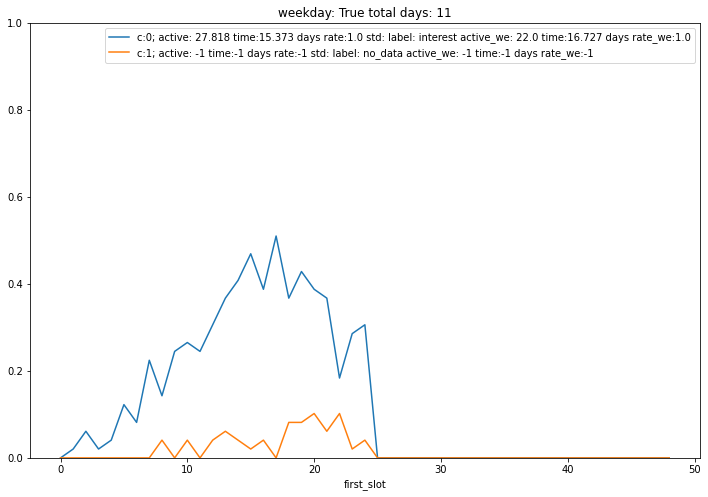

In [622]:
plt.figure(figsize=(12, 8))
plt.ylim(0, 1)

# id_test = pd.unique(ts['id'])
ts_id = 17661
weekday = True
id_ts = ts.query('id == @ts_id and is_weekday == @weekday')
total_slots = len(np.unique(id_ts[['first_slot', 'last_slot']].values.flatten()))
total_days = pd.unique(id_ts['log_date']).shape[0]
for cur_cluster in pd.unique(id_ts['cluster']):
    cur_cluster_ts = id_ts.query('cluster == @cur_cluster')

    fs_data = cur_cluster_ts['first_slot'].value_counts().reindex(range(number_of_slots + 1)).fillna(0)
    ls_data = cur_cluster_ts['last_slot'].value_counts().reindex(range(number_of_slots + 1)).fillna(0)
    profile = (fs_data + ls_data) / len(fs_data)
    label_data = labeled_data.query('id == @ts_id and cluster == @cur_cluster')
    if label_data.shape[0] > 0:
        label =  label_data['label'].iloc[0]
        activity = label_data['activity'].iloc[0]
        mean_time = label_data['mean_time'].iloc[0]
        mean_days = label_data['mean_days'].iloc[0]
        activity_we = label_data['activity_we'].iloc[0]
        mean_time_we = label_data['mean_time_we'].iloc[0]
        mean_days_we = label_data['mean_days_we'].iloc[0]
    else:
        label, activity, mean_time, mean_days, activity_we, mean_time_we, mean_days_we = ['no_data', -1, -1, -1, -1, -1, -1]
    
    plot_label = f"c:{cur_cluster}; active: {round(activity, 3)} time:{round(mean_time, 3)} days rate:{round(mean_days, 3)} std: label: {label}"
    we_label = f" active_we: {round(activity_we, 3)} time:{round(mean_time_we, 3)} days rate_we:{round(mean_days_we, 3)}"
    profile.plot(label=plot_label + we_label)

plt.legend();
plt.title(f"weekday: {weekday} total days: {total_days}");

In [619]:
data = labeled_data.query('id == @ts_id')
geometry = [Point(xy) for xy in zip(data['lon'], data['lat'])]
gdf = gpd.GeoDataFrame(data, geometry=geometry, crs=4326)
gdf.explore(column='label',categorical = True, cmap= ['blue', 'brown', 'green'])

In [620]:
data = df.query('id == @ts_id')
geometry = [Point(xy) for xy in zip(data['lon'], data['lat'])]
gdf = gpd.GeoDataFrame(data, geometry=geometry, crs=4326)
gdf.explore(column='cluster',categorical = True)

In [646]:
labeled_data.groupby('id')['mean_time'].agg(lambda x: np.all(x < 13)).value_counts()

mean_time
False    5286
True      612
Name: count, dtype: int64